<a href="https://colab.research.google.com/github/BoineeloMoyo/-30DayMapChallenge_2023/blob/main/tempearature_gif.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Script to create an animated temperature graph/map from the NetCDF dataset**

In [1]:
import xarray as xr
import os, glob
import imageio

In [2]:
# Print the current working directory
%pwd


'/content'

In [14]:
import numpy as np
#!apt-get install -y imagemagick


In [6]:
png_dir = '/content'
airtemps = xr.tutorial.open_dataset('air_temperature')

<ipython-input-10-5e7a8d095018>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


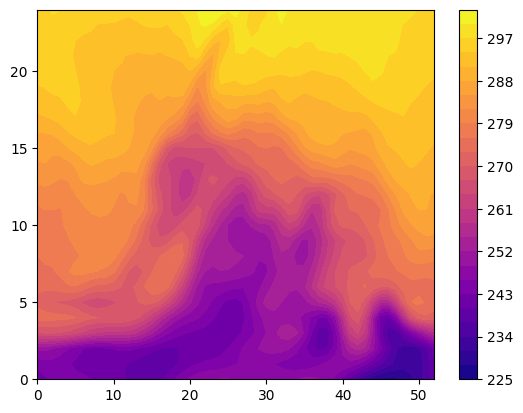

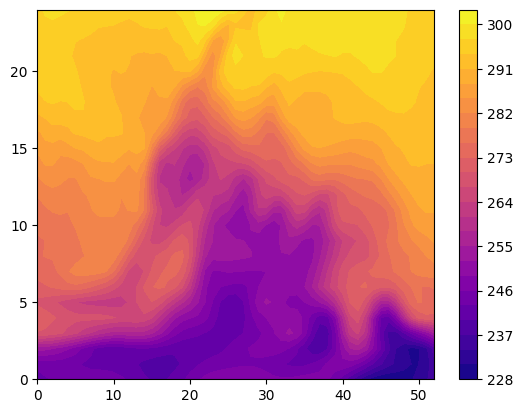

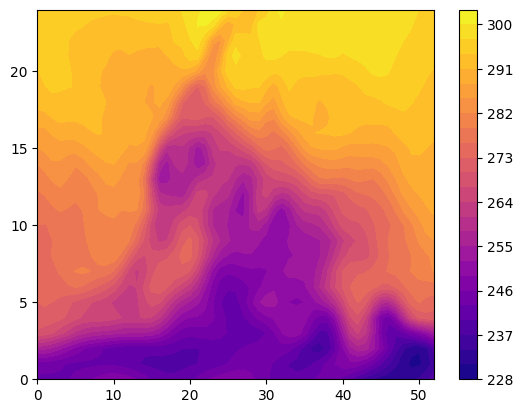

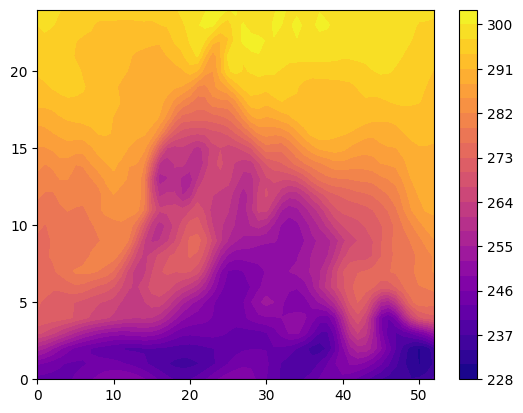

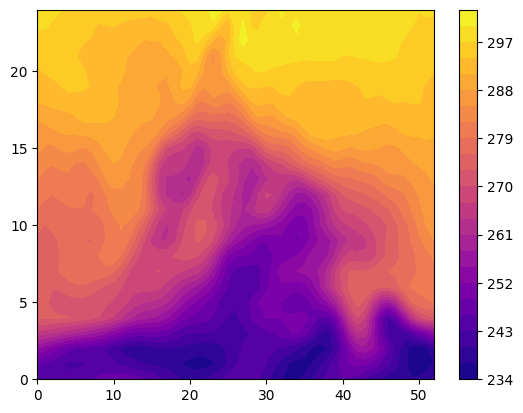

...

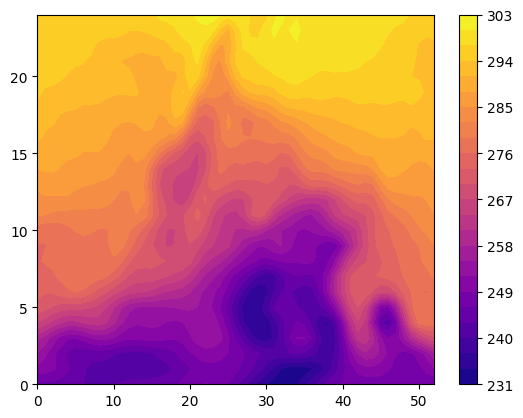

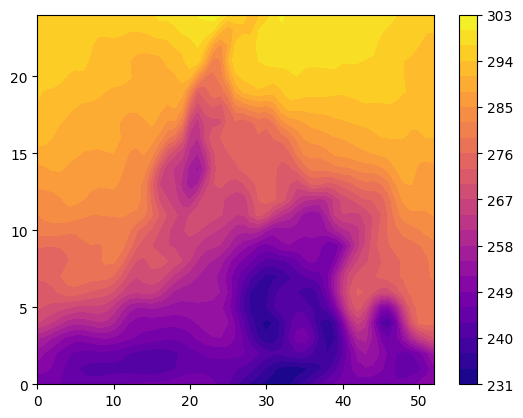

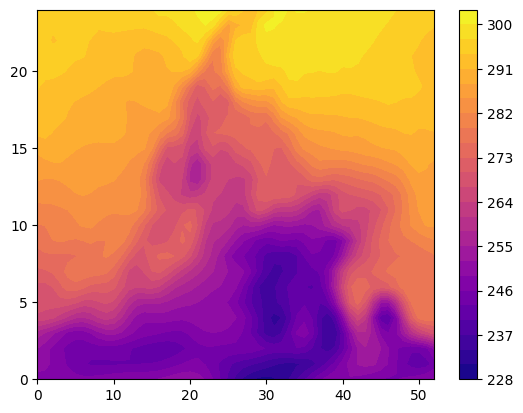

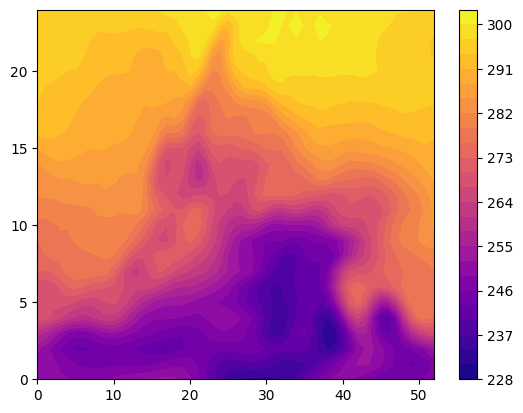

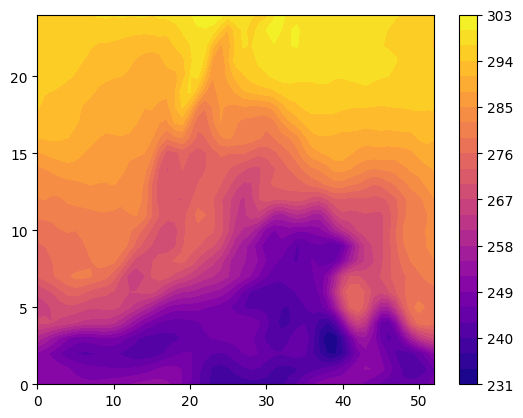

In [10]:
import numpy as np
import matplotlib.pyplot as plt

for i in np.arange(25):
    plt.figure()
    plt.contourf(airtemps.air[i,:,:], levels=25, cmap = 'plasma')
    plt.colorbar()
    plt.savefig(png_dir + 'air_temp_' + str(i) + '.png')

max_temp = airtemps.air[:25,:,:].max()
min_temp = airtemps.air[:25,:,:].min()


<ipython-input-12-9718c9440bbc>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()
<ipython-input-12-9718c9440bbc>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  var = [imageio.imread(file) for file in variable_cb_images]
<ipython-input-12-9718c9440bbc>:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  fix

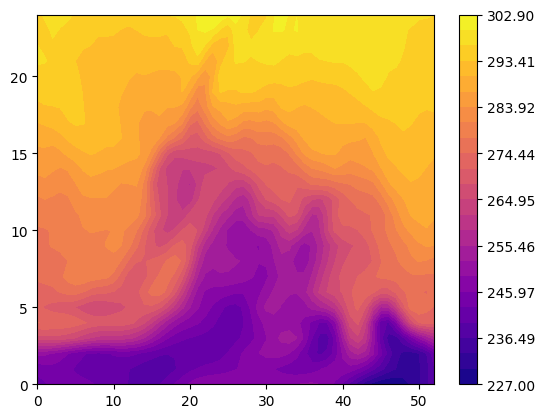

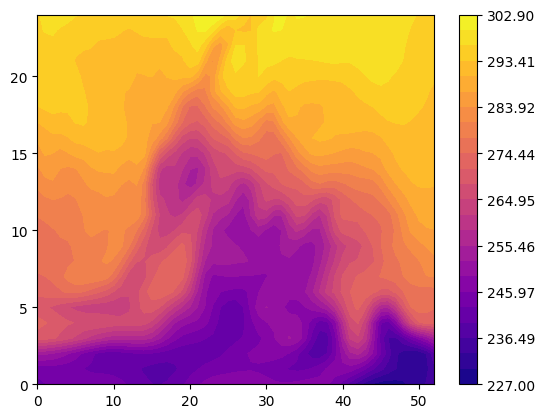

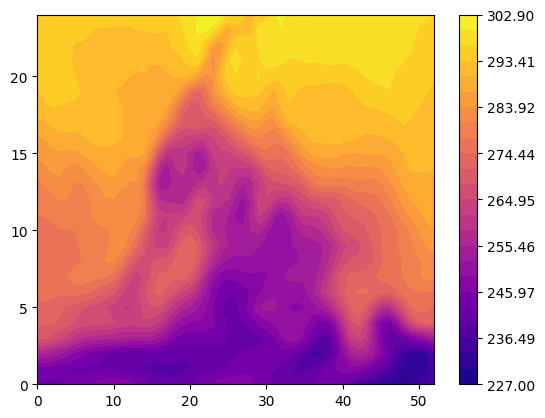

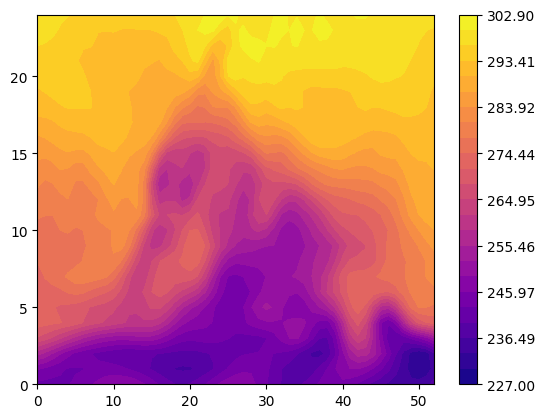

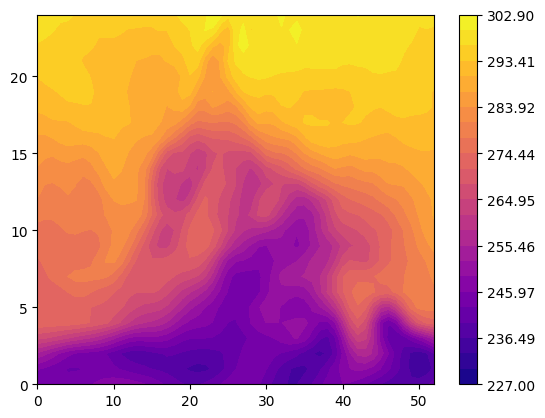

...

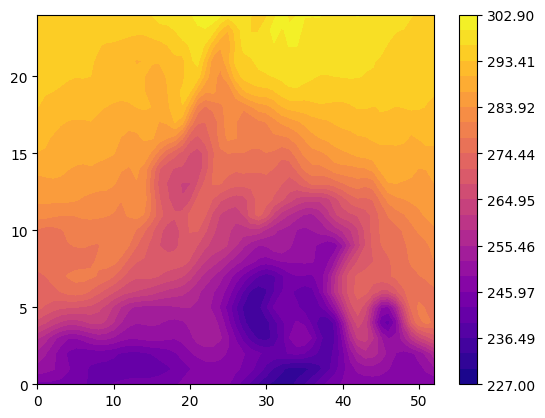

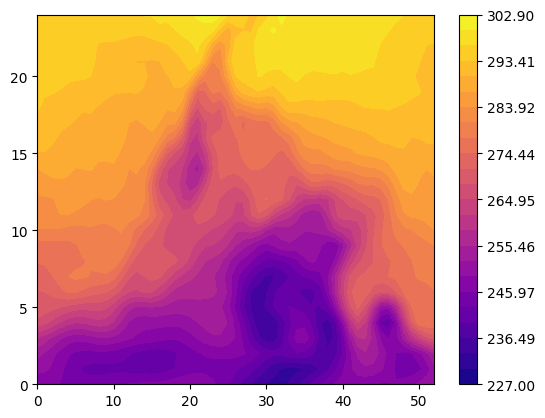

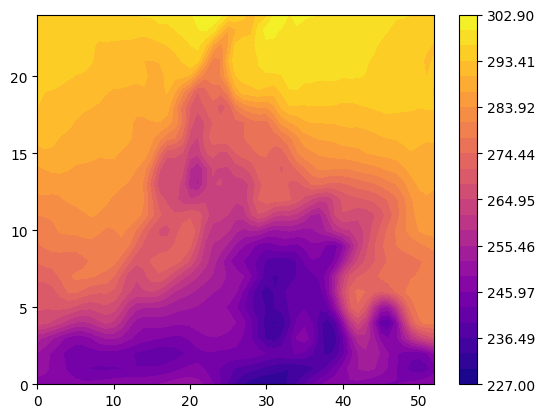

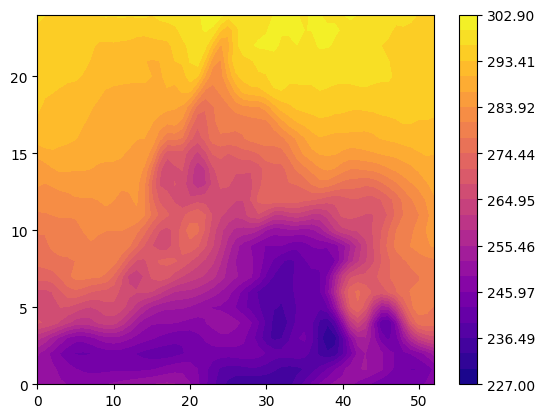

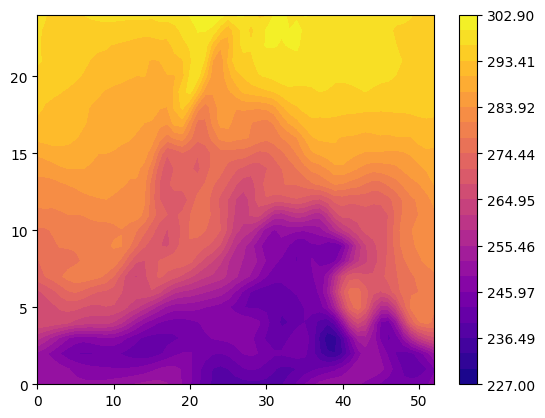

In [12]:
# Plots with Fixed colorbar
for i in np.arange(25):
    plt.figure()
    plt.contourf(airtemps.air[i,:,:], levels = np.linspace(min_temp,max_temp,25), cmap = 'plasma'), plt.colorbar()
    plt.savefig(png_dir + 'fixed_cb_air_temp_' + str(i) +'.png')

variable_cb_images = glob.glob(png_dir + 'air*')
fixed_cb_images = glob.glob(png_dir + ('fix*'))

var = [imageio.imread(file) for file in variable_cb_images]
fix = [imageio.imread(file) for file in fixed_cb_images]

imageio.mimsave(png_dir + '/movie_variable_cb.gif', var, fps = 10)
imageio.mimsave(png_dir + '/movie_fixed_cb.gif', fix, fps = 10)

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image
import glob
import os


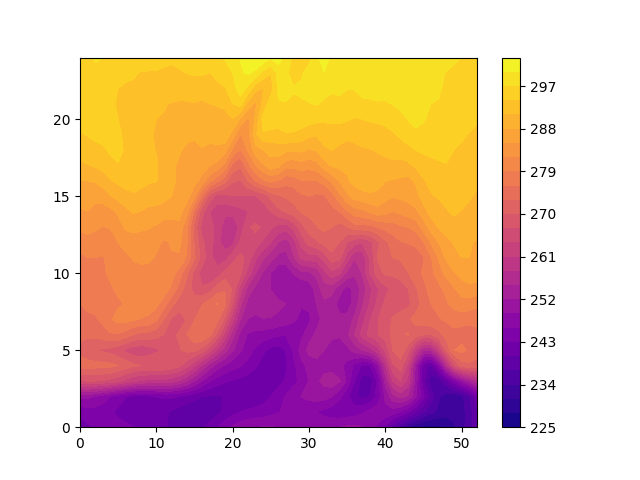

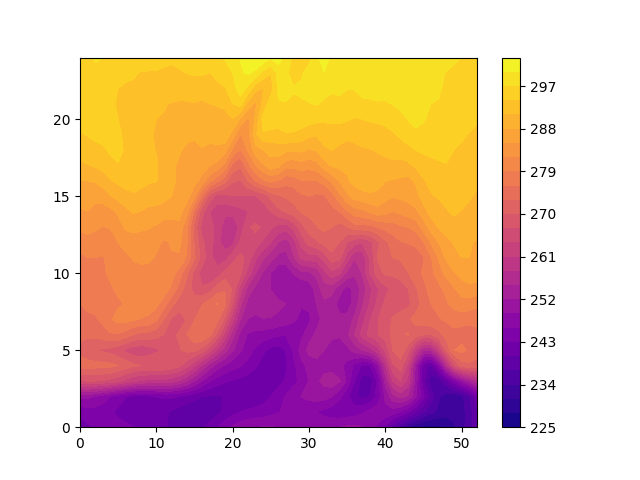

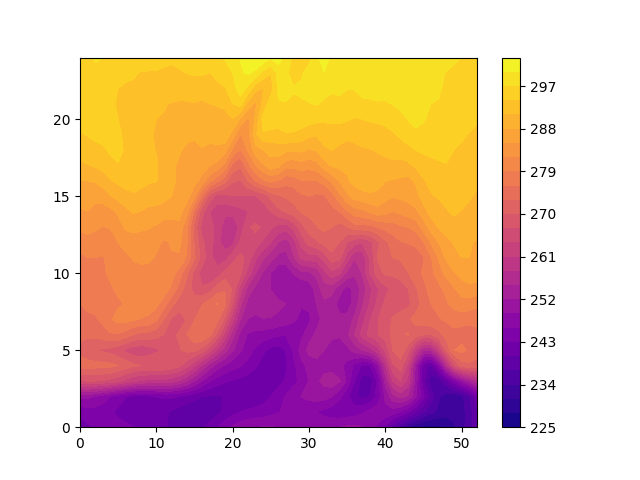

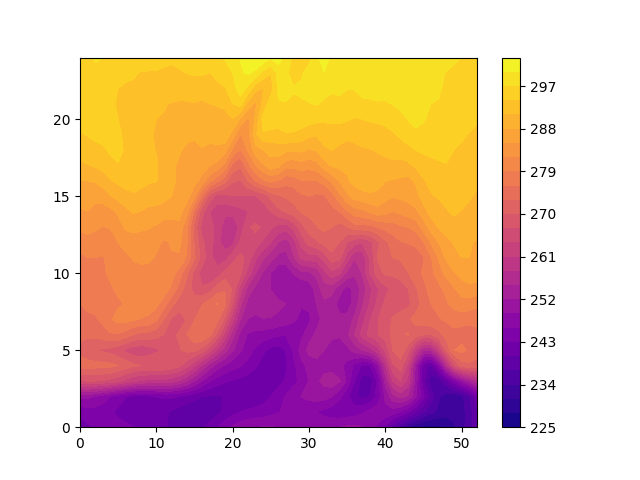

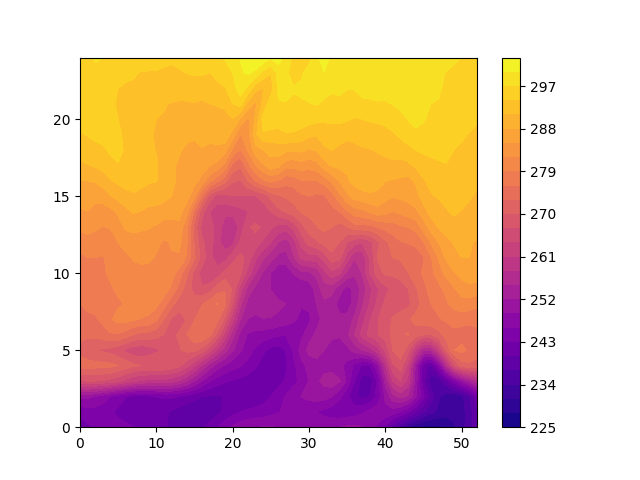

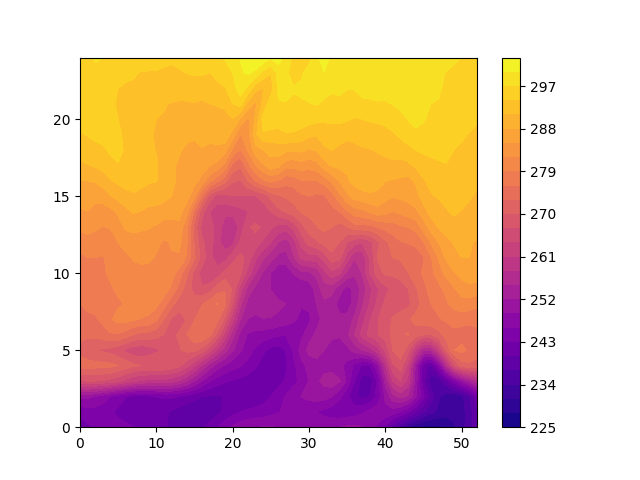

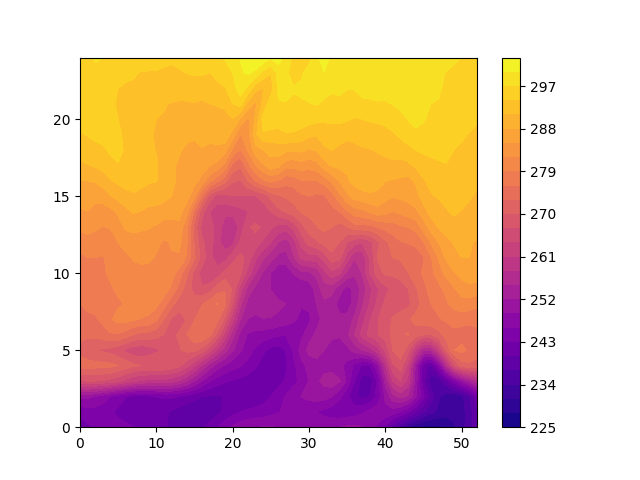

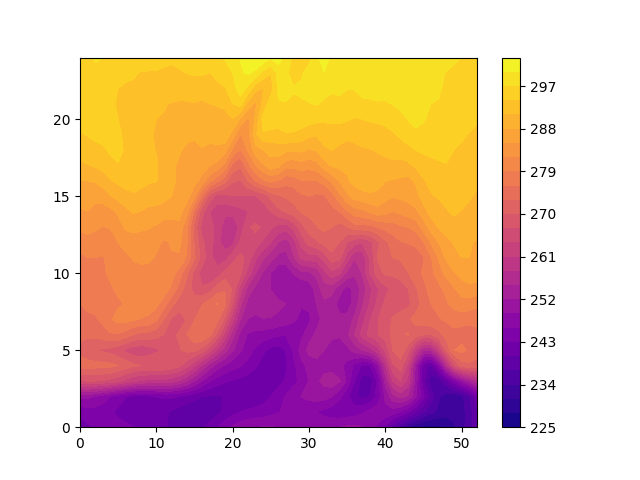

In [ ]:

png_dir = "/content"

# Plots with variable (scaling) colorbar
for i in np.arange(25):
    plt.figure()
    plt.contourf(airtemps.air[i,:,:], levels=25, cmap = 'plasma')
    plt.colorbar()
    plt.savefig(png_dir + 'air_temp_' + str(i) + '.png')
    plt.close()

# Create GIF
gif_path = "/content/animation.gif"
os.system(f"convert -delay 50 {png_dir}*.png {gif_path}")

# Display the animated GIF in a loop
while True:
    with open(gif_path, "rb") as f:
        display(Image(data=f.read(), format="png"))